# Advanced Lane Finding Project
The goals/steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify the binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to the center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera Calibration

The first step in analyzing camera images is to undo distortion so that I can get correct and valuable information out of them. This project provides multiple pictures of a chessboard taken at different angles and distances against a flat surface in the `camera_cal` directory.

OpenCV gives us an easy way to detect chessboard corners with a function called `findChessboardCorners()` to find the coordinates of the corners of the chessboard in a 2D image. These image points will be mapped to the 3D coordinates of the real undistorted chessboard corners, called object points. These object points will be the same for all calibration images since they represent a real chessboard.

`drawChessboardCorners()` provides a simple way to draw corners in an image of a chessboard pattern.

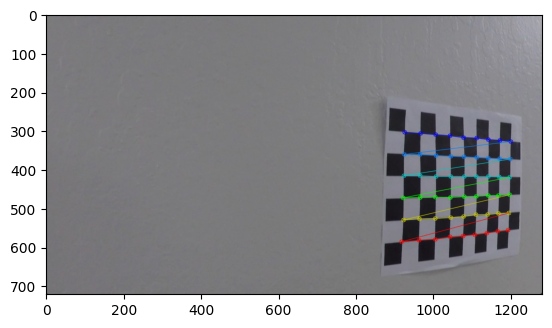

In [1]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in and make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Arrays to store object points and image points from all the images
objpoints = []  # 3D points in real world space
imgpoints = []  # 2D points in image plane

# prepare object points
nx = 9  # the number of inside corners in x
ny = 6  # the number of inside corners in y

# Prepare object points, like (0, 0, 0), (1, 0, 0), (2, 0, 0) ...., (7, 5, 0)
objp = np.zeros((ny * nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)  # x, y coordinates

for fname in images:
    # read in each image
    img = mpimg.imread(fname)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If corners are found, add object points, image points
    if ret:
        imgpoints.append(corners)
        objpoints.append(objp)

        # draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

OpenCV gives us the `calibrateCamera()` function to calibrate a camera. This takes in object points, image points, and the image's shape. Using these inputs, it calculates and returns the distortion coefficients `dist` and the camera matrix `mtx` that we need to transform 3D object points to 2D image points.

The next function I need is `undistort()`. This takes in a distorted image, cour camera matrix, and distortion coefficients. And it returns an undistorted, often called destination image.

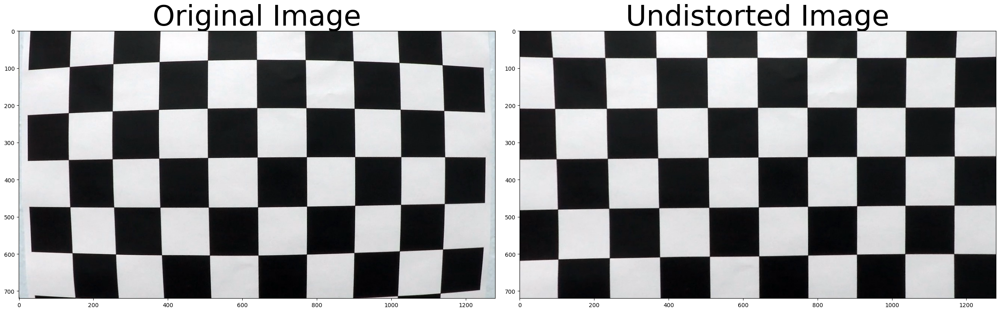

In [2]:
import os
import pickle

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in an image
img = cv2.imread('camera_cal/calibration1.jpg')

# Takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints=[], imgpoints=[], from_file: str = None):
    # Use cv2.calibrateCamera() and cv2.undistort()
    if from_file:
        dist_pickle = pickle.load(open(from_file, "rb"))
        mtx = dist_pickle["mtx"]
        dist = dist_pickle["dist"]
    else:
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
        
        dist_pickle = {}
        dist_pickle["mtx"] = mtx
        dist_pickle["dist"] = dist
        pickle.dump(dist_pickle, open("camera_calibration.pickle", "wb"))
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    return undist

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Gradients and Color Spaces

The undistorted image has been converted from the color space to the HLS space to carry out more information than just a simple grayscale image. I used Canny edge detection, a derivative with respect to the *x* direction on the lightness channel, to find pixels that were likely to be part of the vertical lines in an image. The final image combines binary thresholding of the saturation channel of HLS space and binary thresholding resulting from applying the Sobel operator.

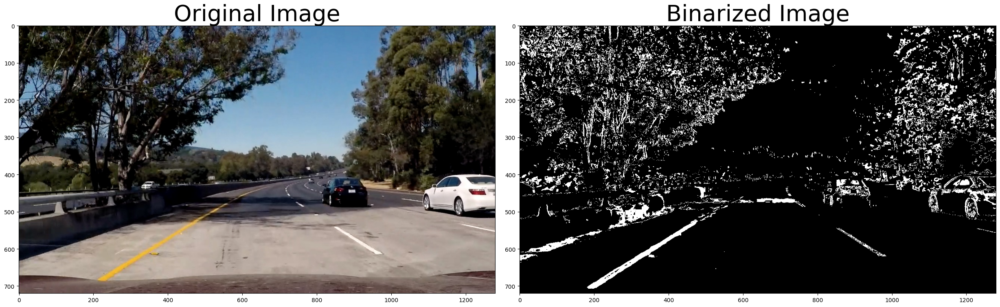

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test5.jpg')

undistorted = cal_undistort(image, from_file="camera_calibration.pickle")

# Edit this function to create your own pipeline.
def binarize(img, s_thresh=(120, 230), sx_thresh=(50, 230)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    binary = (sxbinary | s_binary) * 255
    return binary

result = binarize(undistorted)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Binarized Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Perspective Transform

Next, I identified four source points for perspective transformation. In this case, I assumed a road is a flat plane. I picked four points in a trapezoidal shape that would represent a rectangle when looking down on the road from above. The perspective transformation makes the lines look straight and vertical from a bird's eye view perspective.

For `straight_lines1.jpg` and `straight_lines2.jpg`, the lines should appear vertically in bird's eye view, so I can accurately calibrate the four vertices of the trapezoid.

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


def trapezoid_unwarp(img, draw_roi: bool = False):
    # Pass in your image into this function
    # Write code to do the following steps
    img = np.copy(img)
    
    # a) draw corners
    img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

    # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
        #Note: you could pick any four of the detected corners 
        # as long as those four corners define a rectangle
        #One especially smart way to do this would be to use four well-chosen
        # corners that were automatically detected during the undistortion steps
        #We recommend using the automatic detection of corners in your code
    src = np.float32([[img.shape[1] // 2 + img.shape[1] * 0.032, img.shape[0] * 0.62],
            [img.shape[1] - img.shape[1] * 0.15, img.shape[0]],
            [img.shape[1] * 0.15, img.shape[0]],
            [img.shape[1] // 2 - img.shape[1] * 0.032, img.shape[0] * 0.62]])

    # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    margin = img.shape[1] * 0.25
    dst = np.float32([[img.shape[1] - margin, 0],
                      [img.shape[1] - margin, img.shape[0]],
                      [margin, img.shape[0]],
                      [margin, 0]])
    
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

    if draw_roi:
        warped = cv2.polylines(warped, [np.int32(dst)], True, (255, 0, 0), 4)

    return warped, M, Minv

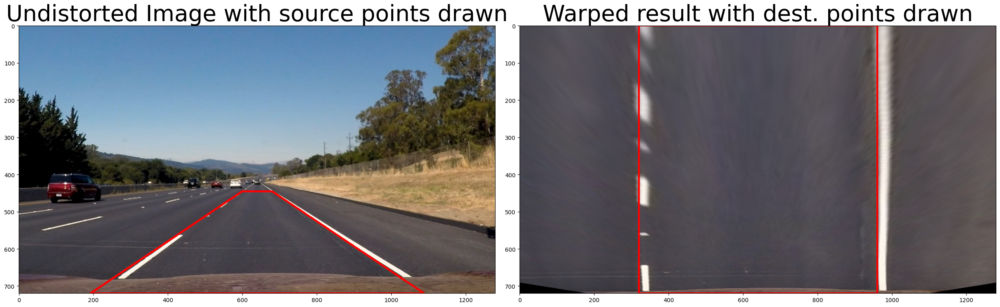

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/straight_lines2.jpg')

# Edit this function to create your own pipeline.
def pipeline(img):
    img = np.copy(img)

    img = cal_undistort(img, from_file="camera_calibration.pickle")
    # img = binarize(img)
   
    img, M, _ = trapezoid_unwarp(img, draw_roi=True)
    return img
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.set_title('Undistorted Image with source points drawn', fontsize=40)
src = np.int32([[image.shape[1] // 2 + image.shape[1] * 0.032, image.shape[0] * 0.62],
                [image.shape[1] - image.shape[1] * 0.15, image.shape[0]],
                [image.shape[1] * 0.15, image.shape[0]],
                [image.shape[1] // 2 - image.shape[1] * 0.032, image.shape[0] * 0.62]])
image = cv2.polylines(image, [src], True, (255, 0, 0), 4)
ax1.imshow(image)

ax2.set_title("Warped result with dest. points drawn", fontsize=40)
ax2.imshow(result)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 4. Finding the Lines: Sliding Window

A histogram of where the binary activations occur across the image is a solution to decide which pixels belong to which lines. The two highest peaks from a histogram as a starting point for determining where the lane lines are, and then use sliding windows moving upward in the image (further along the road) to determine where the lane lines go.

`fit_polynomial()` fits a quadratic function to all the relevant pixels in the sliding window. Here, I calculated an *x*-value for a given *y*, because we expect our lane lines to be (mostly) vertically oriented. 

In [6]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2


def find_lane_pixels(binary_warped, draw_window=False):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = int(binary_warped.shape[0] // nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        if draw_window:
            out_img = cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2) 
            out_img = cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                            (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                            (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    ## Visualization ##
    # Colors in the left and right lane regions
    if draw_window:
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped, draw_window=False):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, draw_window)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return out_img, left_fit, right_fit

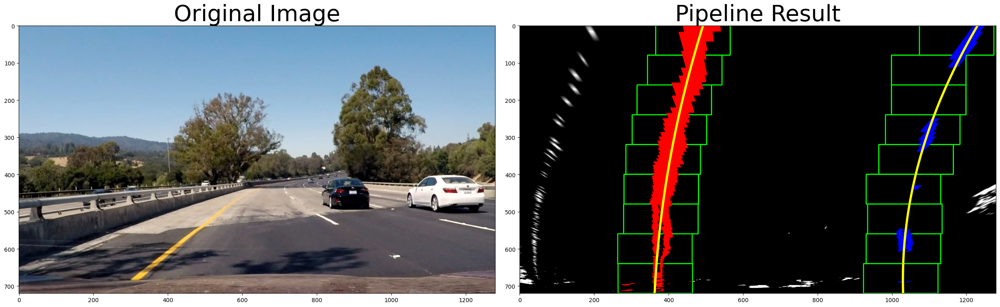

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test4.jpg')

# Edit this function to create your own pipeline.
def pipeline(img):
    img = np.copy(img)
    
    img = cal_undistort(img, from_file="camera_calibration.pickle")
    img = binarize(img)
    img, M, _ = trapezoid_unwarp(img)
    img, left_fit, right_fit = fit_polynomial(img, draw_window=True)

    return img, left_fit, right_fit
    
result, left_fit, right_fit = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)


# Generate x and y values for plotting
ploty = np.linspace(0, result.shape[0] - 1, result.shape[0])
left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

# Plots the left and right polynomials on the lane lines
plt.plot(left_fitx, ploty, color='yellow', linewidth=4)
plt.plot(right_fitx, ploty, color='yellow', linewidth=4)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 5. Finding the Lines: Search from Prior

Using the full algorithm from before and starting fresh on every frame may seem inefficient, as the lane lines don't necessarily move a lot from frame to frame. In the next frame of video, I can just search in a margin around the previous lane line position. So, once I know where the lines are in one frame of video, you can do a highly targeted search for them in the next frame.

After the the line position is found, the average of squared residuals of the least squares fit is calculated. If this value is larger than threshold, the line position is found using the previous sliding window method.

In [8]:
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt


def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit, left_residuals, _, _, _ = np.polyfit(lefty, leftx, 2, full=True)
    right_fit, right_residuals, _, _, _ = np.polyfit(righty, rightx, 2, full=True)

    left_residuials = np.inf if len(left_residuals) == 0 else left_residuals[0] / len(leftx)
    right_residuals = np.inf if len(right_residuals) == 0 else right_residuals[0] / len(rightx)
    residual = left_residuials if abs(left_residuals) > abs(right_residuals) else right_residuals

    return left_fit, right_fit, residual

def search_around_poly(binary_warped, draw_window=False):
    global left_fit, right_fit
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = np.abs(nonzerox - left_fit[0] * nonzeroy**2 - left_fit[1] * nonzeroy - left_fit[2]) < margin
    right_lane_inds = np.abs(nonzerox - right_fit[0] * nonzeroy**2 - right_fit[1] * nonzeroy - right_fit[2]) < margin
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit, residual = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255

    if draw_window:
        # Create an image to draw on and an image to show the selection window    
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    return out_img, left_fit, right_fit, residual

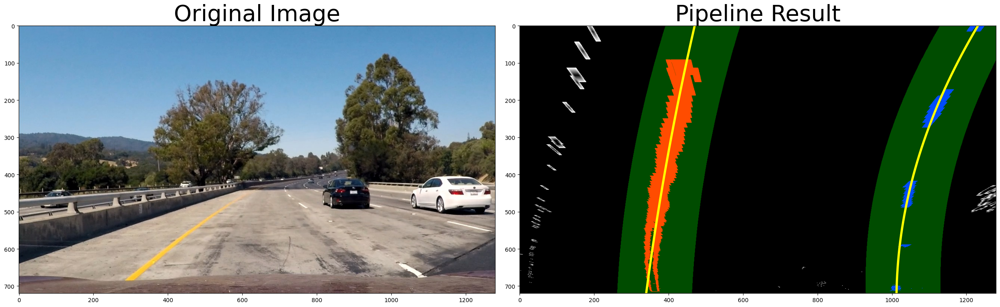

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test1.jpg')

left_fit = np.array([2.08104662e-04, -2.87839922e-01,  4.74101907e+02])
right_fit = np.array([ 4.53324539e-04, -6.19236775e-01,  1.23338506e+03])

# Edit this function to create your own pipeline.
def pipeline(img):
    global left_fit, right_fit

    img = np.copy(img)
    
    img = cal_undistort(img, from_file="camera_calibration.pickle")
    img = binarize(img)
    img, M, _ = trapezoid_unwarp(img)
    img_out, left_fit, right_fit, residual = search_around_poly(img, True)
    return img_out, left_fit, right_fit

result, left_fit, right_fit = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

# Generate x and y values for plotting
ploty = np.linspace(0, result.shape[0] - 1, result.shape[0])
left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

# Plots the left and right polynomials on the lane lines
plt.plot(left_fitx, ploty, color='yellow', linewidth=4)
plt.plot(right_fitx, ploty, color='yellow', linewidth=4)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Warp the lane boundaries onto the original image

The curvature of the curve is measured closest to the vehicle by setting the *y* value as `image.shape[0]`.

The horizontal offset of the vehicle is measured by the difference between the image center and the lane center.

In [10]:
def draw_lines(img, points, color=[255, 0, 0], thickness=2):
    for i in range(len(points) - 1):
        cv2.line(img, (int(points[i][0]), int(points[i][1])), (int(points[i+1][0]), int(points[i+1][1])), color, thickness)
    
    return img

In [11]:
def write_curvature(img, left_fitx, right_fitx, ploty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension
    font = cv2.FONT_HERSHEY_SIMPLEX

    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)

    y_eval_cr = np.max(ploty) * ym_per_pix

    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = (1 + (2 * left_fit_cr[0] * y_eval_cr + left_fit_cr[1])**2)**(3/2) / np.abs(2 * left_fit_cr[0])  
    right_curverad = (1 + (2 * right_fit_cr[0] * y_eval_cr + right_fit_cr[1])**2)**(3/2) / np.abs(2 * right_fit_cr[0])
    
    curverad = (left_curverad + right_curverad) / 2
    cv2.putText(img, f'Radous of curvature: {curverad:.2f}m', (50, 50), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    
    return img

def write_offset(img, left_pts, right_pts, xm_per_pix):
    font = cv2.FONT_HERSHEY_SIMPLEX
    lane_center = (right_pts[-1][0] + left_pts[-1][0]) / 2
    vehicle_center = img.shape[1] / 2
    offset = (vehicle_center - lane_center) * xm_per_pix

    if offset < 0:
        cv2.putText(img, f'Vehicle is {abs(offset):.2f}m left of center', (50, 100), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    else:
        cv2.putText(img, f'Vehicle is {offset:.2f}m right of center', (50, 100), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    return img

In [12]:
def draw_lane(img, Minv, left_fit, right_fit):
    """
    left_fit: left lane polynomial coefficients on the bird's eye view
    right_fit: right lane polynomial coefficients on the bird's eye view
    """
    ym_per_pix = 30 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension

    # Pass in your image into this function
    # Write code to do the following steps
    img = np.copy(img)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    img = write_curvature(img, left_fitx, right_fitx, ploty)

    left_pts = np.array([left_fitx, ploty]).T
    left_pts = cv2.perspectiveTransform(left_pts[None, :, :], Minv).squeeze()
    img = draw_lines(img, left_pts, color=[255, 0, 0], thickness=5)

    right_pts = np.array([right_fitx, ploty]).T
    right_pts = cv2.perspectiveTransform(right_pts[None, :, :], Minv).squeeze()
    img = draw_lines(img, right_pts, color=[0, 0, 255], thickness=5)

    img = write_offset(img, left_pts, right_pts, xm_per_pix=3.7/700)

    vertices = np.vstack((left_pts, right_pts[::-1])).astype(np.int32)
    overlay = img.copy()
    overlay = cv2.fillConvexPoly(overlay, vertices, (0, 255, 0))
    alpha = 0.25
    img = cv2.addWeighted(img, (1 - alpha), overlay, alpha, 0)

    return img

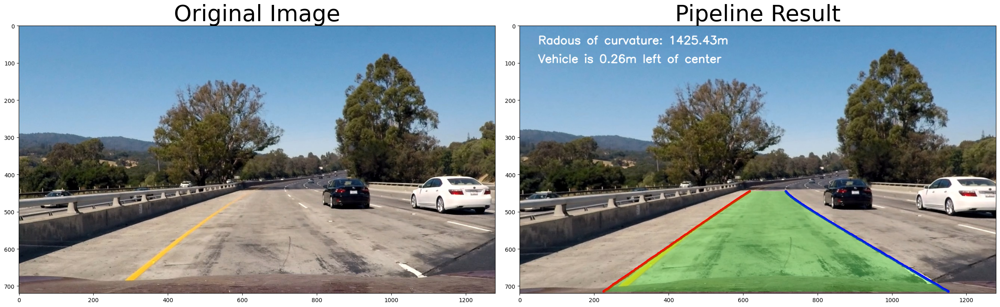

In [13]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('test_images/test1.jpg')

left_fit = np.array([0, 0, 0])
right_fit = np.array([0, 0, 0])
residual = np.inf

# Edit this function to create your own pipeline.
def pipeline(img):
    global left_fit, right_fit, residual
    
    img = np.copy(img)
    
    img = cal_undistort(img, from_file="camera_calibration.pickle")
    img_orig = np.copy(img)
    img = binarize(img)
    img, M, Minv = trapezoid_unwarp(img)
    if (left_fit != 0).all() and (right_fit != 0).all():
        img_out, left_fit, right_fit, residual = search_around_poly(img)
    if residual > 1000:
        img_out, left_fit, right_fit = fit_polynomial(img)

    img_out = draw_lane(img_orig, Minv, left_fit, right_fit)

    return img_out
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

All images in the `test_images` directory have been processed, and the result images can be found at [this link](https://www.dropbox.com/sh/635t27rlzx1fb7v/AADpHMbk0MZmrEUHqqKkAGPJa?dl=0).

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

output_dir = 'output_images'
for f in glob.glob('test_images/*.jpg'):
    left_fit = np.array([0, 0, 0])
    right_fit = np.array([0, 0, 0])
    residual = np.inf

    image = mpimg.imread(f)
    result = pipeline(image)
    plt.imsave(f'{output_dir}/{f.split("/")[-1]}', result)

All videos in the `test_videos` directory have been processed, and the result videos can be found at [this link](https://www.dropbox.com/sh/72yakqd8grdw8zz/AACXSiawKQ5BXONTrxs6uamda?dl=0).

In [15]:
from moviepy.editor import VideoFileClip

output_dir = 'output_videos'
for f in glob.glob('test_videos/*.mp4'):
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ## You may also uncomment the following line for a subclip of the first 5 seconds
    ## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0, 5)
    left_fit = np.array([0, 0, 0])
    right_fit = np.array([0, 0, 0])
    residual = np.inf

    clip1 = VideoFileClip(f)
    white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(f'{output_dir}/{f.split("/")[-1]}', audio=False)

Moviepy - Building video output_videos/challenge_video.mp4.
Moviepy - Writing video output_videos/challenge_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/challenge_video.mp4
CPU times: user 42.8 s, sys: 15.4 s, total: 58.3 s
Wall time: 24.2 s
Moviepy - Building video output_videos/harder_challenge_video.mp4.
Moviepy - Writing video output_videos/harder_challenge_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/harder_challenge_video.mp4
CPU times: user 1min 53s, sys: 34.9 s, total: 2min 28s
Wall time: 1min 12s
Moviepy - Building video output_videos/project_video.mp4.
Moviepy - Writing video output_videos/project_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/project_video.mp4
CPU times: user 1min 49s, sys: 38.6 s, total: 2min 28s
Wall time: 1min 2s


## Discussion

The parameters are heavily influenced by road environmentby: brightness and direction of the sunlight, shadows, road color, etc. The current parameters are customized for the images in `test_images` but don't work well in other environments. For example, it fails with barking shadows, like in `challenge_video.mp4`.

The curve fit algorithm does not work well if the road has severe curves or a series of curves. This can be solved using a higher degree polynomial than a quadratic curve.